## Import lib

In [2]:
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import glob
import pandas as pd

## Set path

In [3]:
# path to git project folder
# e.g. /Users/pannawis/Projects/01_SmartMeter/SmartPowerMeter_SW
projDir = '/Users/pannawis/Projects/01_SmartMeter/SmartPowerMeter_SW'

## Load model.tflite

In [11]:
# model_path = os.path.join(projDir,'trained_model','tflite_1024_100','model.tflite')
# model_path = os.path.join(projDir,'trained_model','resnet50.tflite')
# model_path = os.path.join(projDir,'trained_model','resnet50_float16.tflite')
# model_path = '/Users/pannawis/Projects/01_SmartMeter/SmartPowerMeter_SW/trained_model/model3_1024_100/model.tflite'
# model_path = '/Users/pannawis/Projects/01_SmartMeter/SmartPowerMeter_SW/trained_model/resnet50_concrete.tflite'
model_path = '/Users/pannawis/Projects/01_SmartMeter/SmartPowerMeter_SW/trained_model/ssd_mobilenet_v1_fpn_640x640.tflite'


# Load the TFLite model
# size of pic before get into model come from this Interpreter 
interpreter = tf.lite.Interpreter(model_path=model_path)
# interpreter.resize_tensor_input(0, [1, 640, 640, 3], strict=True)
interpreter.allocate_tensors()

# Get input and output tensors.
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# get details for each layer
all_layers_details = interpreter.get_tensor_details() 

print(input_details)

[{'name': 'serving_default_input:0', 'index': 0, 'shape': array([  1, 640, 640,   3], dtype=int32), 'shape_signature': array([  1, 640, 640,   3], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]


## Custom function

In [12]:
# Load the labels into a list
# classes = ['???'] * model.model_spec.config.num_classes
# label_map = model.model_spec.config.label_map
# for label_id, label_name in label_map.as_dict().items():
#   classes[label_id-1] = label_name

# Define a list of colors for visualization
#COLORS = np.random.randint(0, 255, size=(len(classes), 3), dtype=np.uint8)
classes = ['???']*1
classes[0] = 'PowerMeter'
COLORS = np.random.randint(0, 255, size=(len(classes), 3), dtype=np.uint8)

def preprocess_image(image_path, input_size):
  """Preprocess the input image to feed to the TFLite model"""
  img = tf.io.read_file(image_path)
  img = tf.io.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.uint8)
  original_image = img
  resized_img = tf.image.resize(img, input_size)
  resized_img = resized_img[tf.newaxis, :]
  return resized_img, original_image


def set_input_tensor(interpreter, image):
  """Set the input tensor."""
  tensor_index = interpreter.get_input_details()[0]['index']
  input_tensor = interpreter.tensor(tensor_index)()[0]
  input_tensor[:, :] = image


def get_output_tensor(interpreter, index):
  """Retur the output tensor at the given index."""
  output_details = interpreter.get_output_details()[index]
  tensor = np.squeeze(interpreter.get_tensor(output_details['index']))
  return tensor


def detect_objects(interpreter, image, threshold):
  """Returns a list of detection results, each a dictionary of object info."""
  # Feed the input image to the model
  set_input_tensor(interpreter, image)
  interpreter.invoke()
   
  # Get all outputs from the model
  # boxes = get_output_tensor(interpreter, 0)
  # classes = get_output_tensor(interpreter, 1)
  # scores = get_output_tensor(interpreter, 2)
  # print(f'count: {get_output_tensor(interpreter, 3)}')
  # count = int(get_output_tensor(interpreter, 3))

  # resnet_ssd50 tflite
  boxes = get_output_tensor(interpreter, 1)
  classes = get_output_tensor(interpreter, 2)
  scores = get_output_tensor(interpreter, 3)
  scores = scores[:,1]
  # count = int(get_output_tensor(interpreter, 3))
  count = len(scores)

  results = []
  # print(f'score:{scores}')
  for i in range(count):
    if scores[i] >= threshold:
      result = {
        'bounding_box': boxes[i],
        'class_id': classes[i],
        'score': scores[i]
      }
      results.append(result)
  return results,scores,boxes


def run_odt_and_draw_results(image_path, interpreter, threshold=0.5):
  """Run object detection on the input image and draw the detection results"""
  # Load the input shape required by the model
  _, input_height, input_width, _ = interpreter.get_input_details()[0]['shape']

  # Load the input image and preprocess it
  preprocessed_image, original_image = preprocess_image(
      image_path,
      (input_height, input_width)
    )

  preImg=preprocessed_image.numpy()
  preImg=preImg[0]

  # print(f'OriginalSize: {original_image.shape}')
  # print(f'preprocessed_image: {preprocessed_image.shape}')
    
  # Run object detection on the input image
  results,scores,boxes = detect_objects(interpreter, preprocessed_image, threshold=threshold)
  
  # print(results)  
  # print(scores)
    
  # Plot the detection results on the input image
  original_image_np = original_image.numpy().astype(np.uint8)
  for obj in results:
    # Convert the object bounding box from relative coordinates to absolute
    # coordinates based on the original image resolution
    ymin, xmin, ymax, xmax = obj['bounding_box']

    # print(f'ymin:{ymin}, xmin:{xmin}, ymax:{ymax}, xmax:{xmax}')

    # Plot on original image
    xmin = int(xmin * original_image_np.shape[1])
    xmax = int(xmax * original_image_np.shape[1])
    ymin = int(ymin * original_image_np.shape[0])
    ymax = int(ymax * original_image_np.shape[0])
    # print(f'ymin:{ymin}, xmin:{xmin}, ymax:{ymax}, xmax:{xmax}')

    # Find the class index of the current object
    # class_id = int(obj['class_id'])
    class_id = 0
    # print(f'Class_id:{class_id}')
    
    # Draw the bounding box and label on the image
    color = [int(c) for c in COLORS[class_id]]
    cv2.rectangle(original_image_np, (xmin, ymin), (xmax, ymax), color, 10)
    # Make adjustments to make the label visible for all objects
    y = ymin - 15 if ymin - 15 > 15 else ymin + 15
    label = "{}: {:.0f}%".format(classes[class_id], obj['score'] * 100)
    cv2.putText(original_image_np, label, (xmin, y),
        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # # Plot on 640
    # xmin = int(xmin * preImg.shape[1])
    # xmax = int(xmax * preImg.shape[1])
    # ymin = int(ymin * preImg.shape[0])
    # ymax = int(ymax * preImg.shape[0])

    # # Find the class index of the current object
    # class_id = int(obj['class_id'])
    # class_id = 0
    # print(f'Class_id:{class_id}')
    
    # # Draw the bounding box and label on the image
    # color = [int(c) for c in COLORS[class_id]]
    # cv2.rectangle(preImg, (xmin, ymin), (xmax, ymax), color, 2)
    # # Make adjustments to make the label visible for all objects
    # y = ymin - 15 if ymin - 15 > 15 else ymin + 15
    # label = "{}: {:.0f}%".format(classes[class_id], obj['score'] * 100)
    # cv2.putText(preImg, label, (xmin, y),
    #     cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

  # Return the final image
  # original_uint8 = original_image_np.astype(np.uint8)
  # return original_uint8,original_image,preprocessed_image,results,scores
  
  preImg = preImg.astype(np.uint8)
  return preImg,original_image_np,preprocessed_image,results,scores


## Plot result

In [13]:
# INPUT_IMAGE_URL = "https://storage.googleapis.com/cloud-ml-data/img/openimage/3/2520/3916261642_0a504acd60_o.jpg"
folderImg = '/Users/pannawis/Projects/01_SmartMeter/images/RealEnviron2'
folderSave = '/Users/pannawis/Projects/01_SmartMeter/SmartPowerMeter_SW/images/Meter/RealEnviron2_out_mobilenet'

folderCSV = '/Users/pannawis/Projects/01_SmartMeter/SmartPowerMeter_SW/Report/MeterOut'
nameCSV = 'listNameEnvi2_mobilenet'

listImg = glob.glob(folderImg + '/*.jpg')
# listImg = ['/Users/pannawis/Projects/01_SmartMeter/images/RealEnviron2/IMG_20210706_161805.jpg']

nImgs = len(listImg)
countImg = 0
DETECTION_THRESHOLD = 0.7
dictLog = {'name':[]}

for ipathImg in listImg:
    countImg = countImg + 1 
    nameImg = ipathImg.split('/')[-1]
    print(f'{countImg}/{nImgs}: {nameImg}')

    dictLog['name'].append(nameImg)
    # INPUT_IMAGE_URL = '/Users/pannawis/Projects/01_SmartMeter/SmartPowerMeter_SW/images/Meter/RealEnviron_1024/IMG_20210525_075300.jpg'
    INPUT_IMAGE_URL = ipathImg

    TEMP_FILE = '/tmp/image.png'

    !wget -q -O $TEMP_FILE $INPUT_IMAGE_URL
    # im = Image.open(TEMP_FILE)
    im = Image.open(INPUT_IMAGE_URL)

    im.thumbnail((512, 512), Image.ANTIALIAS)
    im.save(TEMP_FILE, 'PNG')

    # Need to resize before send to model

    # Run inference and draw detection result on the local copy of the original file
    # detection_result_image,original_image,preprocessed_image,results,scores = run_odt_and_draw_results(
    #     TEMP_FILE,
    #     interpreter,
    #     threshold=DETECTION_THRESHOLD
    # )
    detection_result_image,original_image,preprocessed_image,results,scores = run_odt_and_draw_results(
        INPUT_IMAGE_URL,
        interpreter,
        threshold=DETECTION_THRESHOLD)

    # Show the detection result
    # Image.fromarray(original_image)

    cv2.imwrite(folderSave + '/' + nameImg, original_image)
dfName = pd.DataFrame(dictLog)
dfName.to_csv(folderCSV + '/' + nameCSV)
print('#----Finish----#')

1/60: IMG_20210706_161816.jpg


IndexError: too many indices for array: array is 0-dimensional, but 2 were indexed

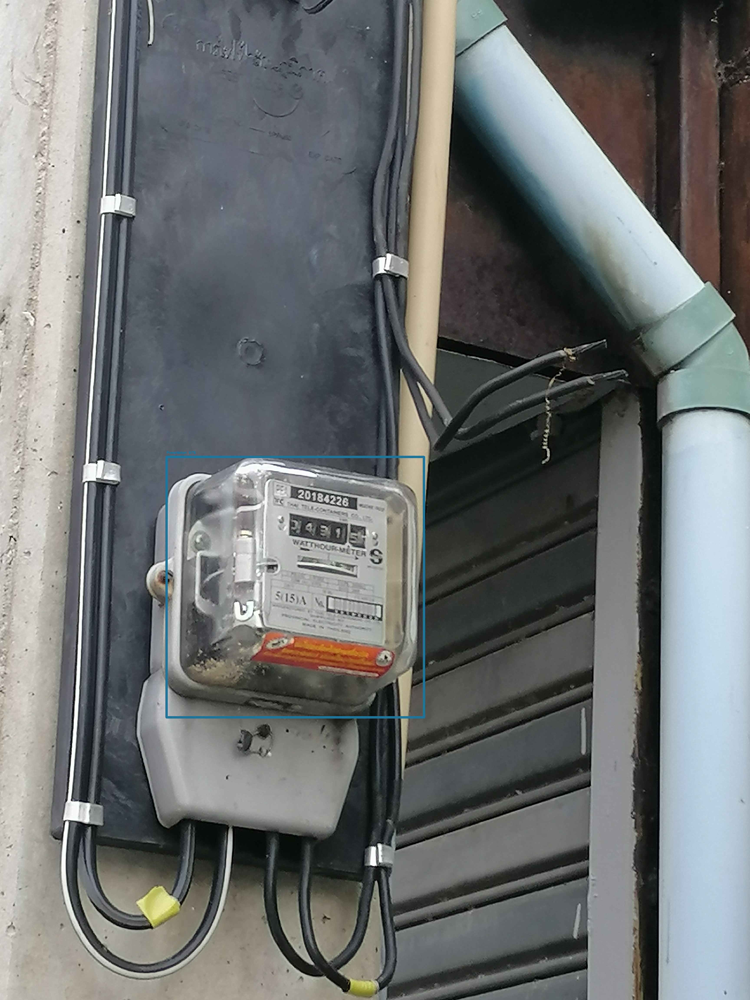

In [8]:
Image.fromarray(original_image)

In [17]:
folderImg = '/Users/pannawis/Projects/01_SmartMeter/images/RealEnviron2'
folderSave = '/Users/pannawis/Projects/01_SmartMeter/images/RealEnviron2_detected'

listImg = glob.glob(folderImg + '/*.jpg')
nImgs = len(listImg)
countImg = 0

dictLog = {'name':[]}

for ipathImg in listImg:
    countImg = countImg + 1 
    nameImg = ipathImg.split('/')[-1]

    dictLog['name'].append(nameImg)
    
dfName = pd.DataFrame(dictLog)
dfName.to_csv('listName_RealEnviron2.csv')


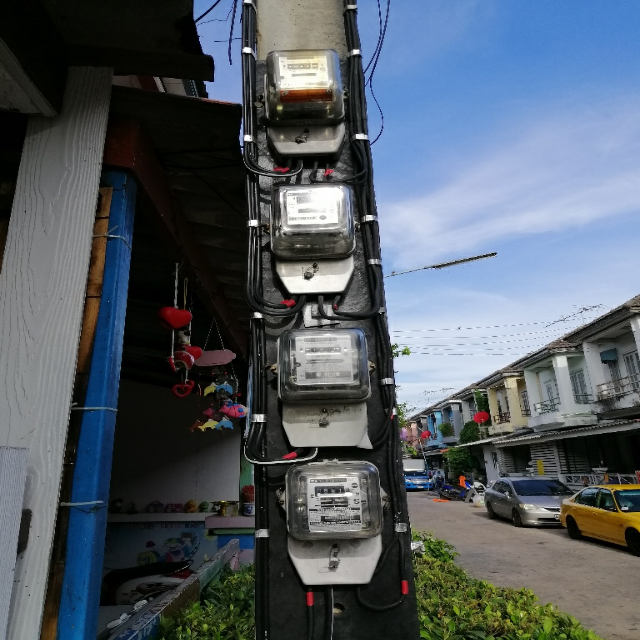

In [24]:
preImg=preprocessed_image.numpy()
Image.fromarray(preImg[0].astype(np.uint8))

OriginalSize: (1024, 768, 3)
preprocessed_image: (1, 640, 640, 3)
[0.8203125  0.35546875 0.125      0.0859375  0.078125   0.0625
 0.046875   0.046875   0.03515625 0.02734375 0.02734375 0.02734375
 0.02734375 0.02734375 0.02734375 0.0234375  0.01953125 0.01953125
 0.01953125 0.01953125 0.015625   0.015625   0.015625   0.015625
 0.015625  ]
Class_id:0
Class_id:0
Class_id:0
Class_id:0
Class_id:0
Class_id:0
Class_id:0
Class_id:0
Class_id:0
Class_id:0
Class_id:0
Class_id:0
Class_id:0
Class_id:0
Class_id:0
Class_id:0


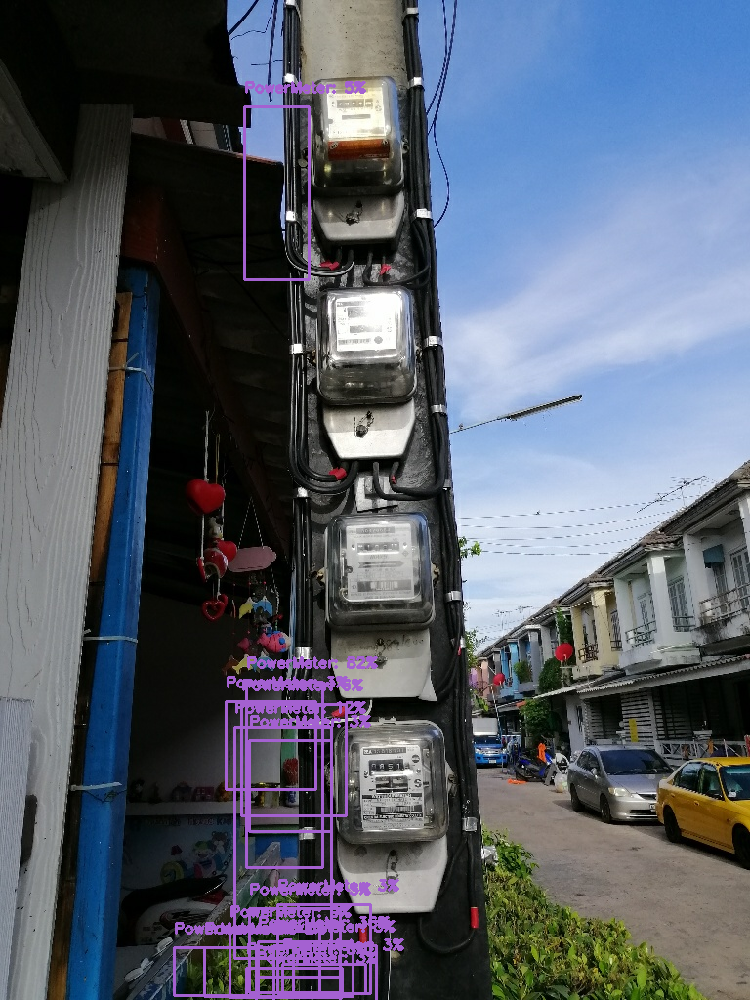

In [5]:
# INPUT_IMAGE_URL = "https://storage.googleapis.com/cloud-ml-data/img/openimage/3/2520/3916261642_0a504acd60_o.jpg"
INPUT_IMAGE_URL = '/Users/pannawis/Projects/01_SmartMeter/images/RealEnviron_1024/IMG_20210525_075306.jpg'

DETECTION_THRESHOLD = 0.02

TEMP_FILE = '/tmp/image.png'

!wget -q -O $TEMP_FILE $INPUT_IMAGE_URL
# im = Image.open(TEMP_FILE)
im = Image.open(INPUT_IMAGE_URL)

im.thumbnail((512, 512), Image.ANTIALIAS)
im.save(TEMP_FILE, 'PNG')


# Need to resize before send to model

# Run inference and draw detection result on the local copy of the original file
# detection_result_image,original_image,preprocessed_image,results,scores = run_odt_and_draw_results(
#     TEMP_FILE,
#     interpreter,
#     threshold=DETECTION_THRESHOLD
# )
detection_result_image,original_image,preprocessed_image,results,scores = run_odt_and_draw_results(
    INPUT_IMAGE_URL,
    interpreter,
    threshold=DETECTION_THRESHOLD
)

# Show the detection result
#Image.fromarray(original_image.numpy())
#Image.fromarray(preprocessed_image.numpy())
Image.fromarray(detection_result_image)

In [34]:
aa={'a':1}
aa.a

AttributeError: 'dict' object has no attribute 'a'